# Assignment 03

Caroline O’Sullivan (Boston University)  
September 20, 2025

In [57]:
from pyspark.sql import SparkSession
import pandas as pd
import plotly.express as px
import plotly.io as pio
import numpy as np
import plotly.graph_objects as go
import numpy as np
import re
from pyspark.sql.functions import col, split, explode, regexp_replace, transform, when, count
from pyspark.sql import functions as F
from pyspark.sql.functions import col, monotonically_increasing_id
import ast

np.random.seed(42)

pio.renderers.default = "notebook+svg"

# Initialize Spark Session
spark = SparkSession.builder.appName("LightcastData").getOrCreate()

# Load Data
df = spark.read.option("header", "true").option("inferSchema", "true").option("multiLine","true").option("escape", "\"").csv("data/lightcast_job_postings.csv")

# Show Schema and Sample Data
#print("---This is Diagnostic check, No need to print it in the final doc---")

#df.printSchema() # comment this line when rendering the submission
#df.show(5)

In [37]:
print(df.columns)
df.show(5)

['ID', 'LAST_UPDATED_DATE', 'LAST_UPDATED_TIMESTAMP', 'DUPLICATES', 'POSTED', 'EXPIRED', 'DURATION', 'SOURCE_TYPES', 'SOURCES', 'URL', 'ACTIVE_URLS', 'ACTIVE_SOURCES_INFO', 'TITLE_RAW', 'BODY', 'MODELED_EXPIRED', 'MODELED_DURATION', 'COMPANY', 'COMPANY_NAME', 'COMPANY_RAW', 'COMPANY_IS_STAFFING', 'EDUCATION_LEVELS', 'EDUCATION_LEVELS_NAME', 'MIN_EDULEVELS', 'MIN_EDULEVELS_NAME', 'MAX_EDULEVELS', 'MAX_EDULEVELS_NAME', 'EMPLOYMENT_TYPE', 'EMPLOYMENT_TYPE_NAME', 'MIN_YEARS_EXPERIENCE', 'MAX_YEARS_EXPERIENCE', 'IS_INTERNSHIP', 'SALARY', 'REMOTE_TYPE', 'REMOTE_TYPE_NAME', 'ORIGINAL_PAY_PERIOD', 'SALARY_TO', 'SALARY_FROM', 'LOCATION', 'CITY', 'CITY_NAME', 'COUNTY', 'COUNTY_NAME', 'MSA', 'MSA_NAME', 'STATE', 'STATE_NAME', 'COUNTY_OUTGOING', 'COUNTY_NAME_OUTGOING', 'COUNTY_INCOMING', 'COUNTY_NAME_INCOMING', 'MSA_OUTGOING', 'MSA_NAME_OUTGOING', 'MSA_INCOMING', 'MSA_NAME_INCOMING', 'NAICS2', 'NAICS2_NAME', 'NAICS3', 'NAICS3_NAME', 'NAICS4', 'NAICS4_NAME', 'NAICS5', 'NAICS5_NAME', 'NAICS6', 'NAIC

In [64]:
#Data Preparation and Cleaning

df = df.withColumn("SALARY", df["SALARY"].cast("float"))\
        .withColumn("SALARY_TO", df["SALARY_TO"].cast("float"))\
        .withColumn("SALARY_FROM", df["SALARY_FROM"].cast("float"))\
        .withColumn("MIN_YEARS_EXPERIENCE", df["MIN_YEARS_EXPERIENCE"].cast("float"))\
        .withColumn("MAX_YEARS_EXPERIENCE", df["MAX_YEARS_EXPERIENCE"].cast("float"))
        
#Calculate average and median for filling missing values
median_salary = df.approxQuantile("SALARY", [0.5], 0.01)[0]
median_to_salary = df.approxQuantile("SALARY_TO", [0.5], 0.01)[0]
median_from_salary = df.approxQuantile("SALARY_FROM", [0.5], 0.01)[0]

df = df.fillna({"SALARY": median_salary,
                 "SALARY_TO": median_to_salary,
                 "SALARY_FROM": median_from_salary,})

df = df.withColumn("Average Salary", (df["SALARY_TO"] + df["SALARY_FROM"])/2)
df = df.na.drop(subset=["EMPLOYMENT_TYPE_NAME"])

export_cols = [
    "Average Salary", "SALARY", "SALARY_TO", "SALARY_FROM",
    "MIN_YEARS_EXPERIENCE", "MAX_YEARS_EXPERIENCE",
    "EMPLOYMENT_TYPE_NAME", "NAICS2_NAME", "EDUCATION_LEVELS_NAME", "LOT_V6_SPECIALIZED_OCCUPATION_NAME", "REMOTE_TYPE_NAME", "LOT_OCCUPATION_NAME"
]

df_selected = df.select(export_cols)
pdf = df_selected.toPandas()
pdf.to_csv("data/cleaned_lightcast_job_postings.csv", index=False)

#Clean employment type names & education level names
pdf["EMPLOYMENT_TYPE_NAME"] = pdf["EMPLOYMENT_TYPE_NAME"].astype(str).apply(
    lambda x: re.sub(r"[^\x00-\x7F]+", "", x)
)
pdf["EDUCATION_LEVELS_NAME"] = pdf["EDUCATION_LEVELS_NAME"].astype(str).str.replace(r"[\n\r\\\"\[\]]", "", regex=True)
print(pdf.columns.tolist())

['Average Salary', 'SALARY', 'SALARY_TO', 'SALARY_FROM', 'MIN_YEARS_EXPERIENCE', 'MAX_YEARS_EXPERIENCE', 'EMPLOYMENT_TYPE_NAME', 'NAICS2_NAME', 'EDUCATION_LEVELS_NAME', 'LOT_V6_SPECIALIZED_OCCUPATION_NAME', 'REMOTE_TYPE_NAME', 'LOT_OCCUPATION_NAME']


In [31]:
#Salary Distribution Employment Type
fig = px.box(
    pdf,
    x="EMPLOYMENT_TYPE_NAME",
    y="SALARY",
    title="Salary Distribution by Employment Type",
    color_discrete_sequence=["#C71585"],
    points="outliers",
)
fig.update_layout(
    font_family="Verdana",
    title_font_size=16,
    xaxis_title="Employment Type",
    yaxis_title="Salary",
    xaxis_tickangle=45,
)
fig.show()
fig.write_html("Q1.html")
fig.write_image("Q1.png")


In [30]:
#Salary Distribution by Industry
fig = px.box(
    pdf,
    x="NAICS2_NAME",
    y="SALARY",
    title="Salary Distribution by Industry",
    color_discrete_sequence=["#C71585"],
    points="outliers",
)
fig.update_layout(
    height=900,
    font_family="Verdana",
    title_font_size=16,
    xaxis_title="Industry",
    yaxis_title="Salary",
    xaxis_tickangle=45,
)
fig.show()
fig.write_html("Q1b.html")
fig.write_image("Q1b.png")

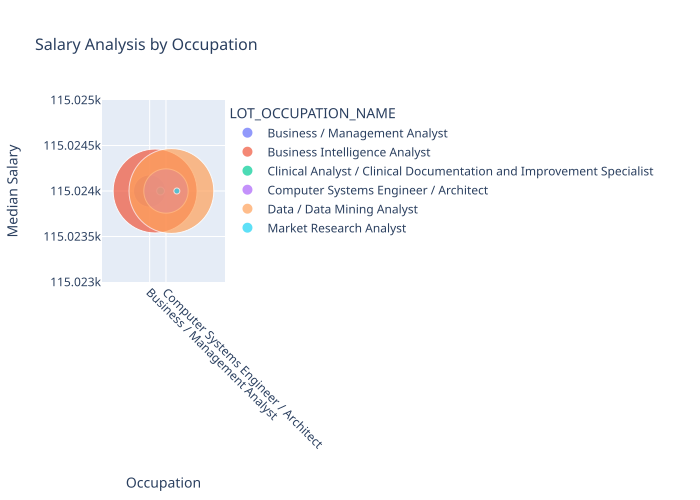

In [50]:
#Salary Analysis by Occupation Type

# Aggregate data
salary_analysis = pdf.groupby("LOT_OCCUPATION_NAME").agg(
    median_salary=("SALARY", "median"),
    job_count=("SALARY", "count")
).reset_index()

fig = px.scatter(
    salary_analysis,
    x="LOT_OCCUPATION_NAME",
    y="median_salary",
    size="job_count",        
    size_max=60,             
    color="LOT_OCCUPATION_NAME", 
    color_continuous_scale="Plasma",
    title="Salary Analysis by Occupation"
)

fig.update_layout(
    width=1200,
    height=600,
    font_family="Verdana",
    title_font_size=16,
    xaxis_title="Occupation",
    yaxis_title="Median Salary",
    xaxis_tickangle=45
)

fig.show()
fig.write_html("Q2.html")
fig.write_image("Q2.png")


In [65]:
#Used this to preview the Education names for grouping later
pdf.groupby("EDUCATION_LEVELS_NAME").size().reset_index(name="job_count").sort_values(
    by="job_count", ascending=False
)

,EDUCATION_LEVELS_NAME,job_count
8,Bachelor's degree,29969
27,No Education Listed,22110
9,"Bachelor's degree, Master's degree",10501
1,"Associate degree, Bachelor's degree",1972
25,Master's degree,1623
12,High school or GED,1541
19,"High school or GED, Bachelor's degree",1408
10,"Bachelor's degree, Master's degree, Ph.D. ...",853
0,Associate degree,786
2,"Associate degree, Bachelor's degree, Maste...",267


In [66]:
print(pdf["EDUCATION_LEVELS_NAME"].unique())

["  Bachelor's degree" '  No Education Listed'
 "  Bachelor's degree,  Master's degree"
 "  High school or GED,  Associate degree,  Bachelor's degree"
 "  Associate degree,  Bachelor's degree,  Master's degree"
 "  Associate degree,  Bachelor's degree"
 "  High school or GED,  Bachelor's degree,  Master's degree,  Ph.D. or professional degree"
 '  High school or GED' "  Master's degree"
 "  High school or GED,  Bachelor's degree"
 "  Bachelor's degree,  Master's degree,  Ph.D. or professional degree"
 '  Associate degree' '  Ph.D. or professional degree'
 "  High school or GED,  Bachelor's degree,  Master's degree"
 '  High school or GED,  Associate degree'
 "  High school or GED,  Master's degree"
 "  Bachelor's degree,  Ph.D. or professional degree"
 "  Master's degree,  Ph.D. or professional degree"
 "  High school or GED,  Bachelor's degree,  Ph.D. or professional degree"
 "  High school or GED,  Associate degree,  Bachelor's degree,  Master's degree"
 "  Associate degree,  Master'

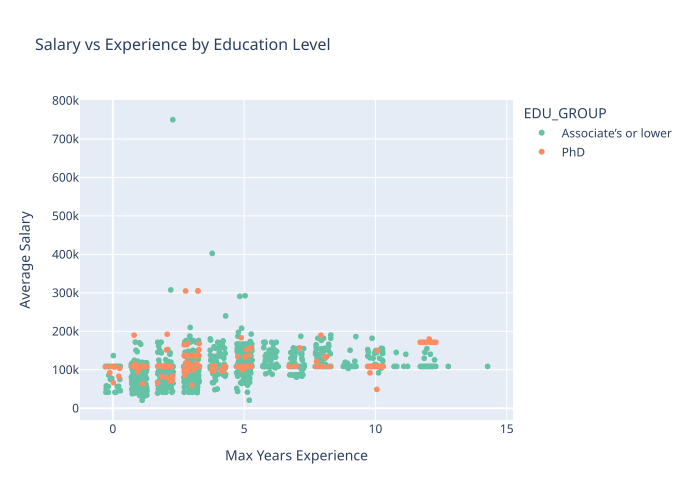

In [71]:
#Salary by Education Level
def map_education(edu_str):
    try:
        edu_list = [e.strip() for e in edu_str.split(",")]

        education_grouping = {
            "High school or GED": "Associate’s or lower",
            "GED": "Associate’s or lower",
            "Associate degree": "Associate’s or lower",
            "No Education Listed": "Associate’s or lower",
            "Bachelor’s degree": "Bachelor’s",
            "Master’s degree": "Master’s",
            "Ph.D. or professional degree": "PhD",
            "Doctorate": "PhD",
            "Professional degree": "PhD"
        }
        mapped_levels = set()
        for e in edu_list:
            mapped = education_grouping.get(e)
            if mapped:
                mapped_levels.add(mapped)
        return list(mapped_levels) if mapped_levels else None
    except:
        return None

# Create new dataframe to avoid modifying original
plot_df = pdf.copy()
plot_df["EDU_GROUP"] = plot_df["EDUCATION_LEVELS_NAME"].apply(map_education)
plot_df = plot_df.explode("EDU_GROUP")
plot_df = plot_df.dropna(subset=["EDU_GROUP", "MAX_YEARS_EXPERIENCE", "Average Salary"])
np.random.seed(42)
plot_df["MAX_YEARS_EXPERIENCE_JITTER"] = plot_df["MAX_YEARS_EXPERIENCE"] + np.random.uniform(-0.3, 0.3, size=len(plot_df))

fig = px.scatter(
    plot_df,
    x="MAX_YEARS_EXPERIENCE_JITTER",
    y="Average Salary",
    color="EDU_GROUP",
    hover_data=["LOT_V6_SPECIALIZED_OCCUPATION_NAME", "MAX_YEARS_EXPERIENCE", "Average Salary"],
    title="Salary vs Experience by Education Level",
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_layout(
    xaxis_title="Max Years Experience",
    yaxis_title="Average Salary",
    width=1000,
    height=600,
    font_family="Verdana",
    title_font_size=16
)

fig.show()
fig.write_html("Q3.html")
fig.write_image("Q3.png")

#Here I used Generate AI in order to parse through the multiple string values in the EDUCATION_LEVELS_NAME column and create a mapping function to group them into broader categories.